# FFT

In [1]:
# Load libraries:
import numpy as np
import matplotlib.pyplot as plt

import lsst.daf.butler as dafButler
import lsst.afw.display 
import lsst.cp.verify.notebooks.utils as utils


import lsst.display.matplotlib
lsst.afw.display.setDefaultBackend("matplotlib")

In [2]:
params = {'axes.labelsize': 28,
          'font.size': 24,
          'legend.fontsize': 14,
          'xtick.major.width': 3,
          'xtick.minor.width': 2,
          'xtick.major.size': 12,
          'xtick.minor.size': 6,
          'xtick.direction': 'in',
          'xtick.top': True,
          'lines.linewidth': 3,
          'axes.linewidth': 3,
          'axes.labelweight': 3,
          'axes.titleweight': 3,
          'ytick.major.width': 3,
          'ytick.minor.width': 2,
          'ytick.major.size': 12,
          'ytick.minor.size': 6,
          'ytick.direction': 'in',
          'ytick.right': True,
          'figure.figsize': [12, 10],
          'figure.facecolor': 'White'
          }

plt.rcParams.update(params)

In [3]:
#### BEGIN NOTEBOOK EXCERPT #####
# This cell should be edited to match the data to be inspected.

EXPOSURES=np.array([2022031700209, 2022031700211, 2022031700210, 2022031700204,2022031700208, 2022031700205, 2022031700207, 2022031700201,2022031700206])
EXPOSURES_VERIFY=np.array([2022031700202, 2022031700203])

# Which calibration type to analyse.
calibType = 'flat'
physical_filter = 'empty~empty'
# Camera
cameraName = 'LATISS'
detectorId=0

# Collection name containing the verification outputs.
verifyCollection = 'u/dagoret/myflats.20221109/verifyFlat.20220317c'
# Collection that the calibration was constructed in.
genCollection = 'u/dagoret/myflats.20221109/flatGen.20220317c'

In [4]:
# Get butler and camera
butler = dafButler.Butler('/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/data/butler.yaml', collections=[verifyCollection, genCollection])
camera = butler.get('camera', instrument=cameraName)

In [5]:
calib = butler.get(calibType, instrument=cameraName, physical_filter=physical_filter, detector=detectorId)
calibArray = calib.getImage().getArray()

vmin=-1.290,vmax=9.528,vmean=0.999,vmed=0.998,vstd=0.026


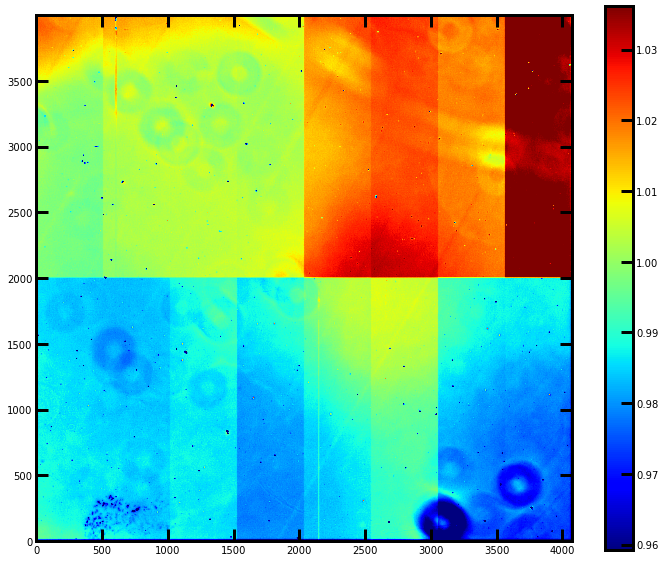

In [6]:
vmin=calib.image.array.min()
vmax=calib.image.array.max()
vmean=calib.image.array.mean()
vmed=np.median(calib.image.array)
vstd=np.std(calib.image.array)
print(f"vmin={vmin:.3f},vmax={vmax:.3f},vmean={vmean:.3f},vmed={vmed:.3f},vstd={vstd:.3f}")
nsig=1.5
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(12,10))
im=ax.imshow(calib.image.array,origin="lower",vmin=vmed-nsig*vstd,vmax=vmed+nsig*vstd,cmap="jet")
fig.colorbar(im)

# Fourier Transform

- https://bertvandenbroucke.netlify.app/2019/05/24/computing-a-power-spectrum-in-python/

In [7]:
NPIXY,NPIXX=calib.image.array.shape
print(NPIXX,NPIXY)

4072 4000


In [8]:
fourier_image = np.fft.fftn(calib.image.array)
fourier_amplitudes = np.abs(fourier_image)**2
fourier_amplitudes_log = np.log10(fourier_amplitudes)

In [9]:
fourier_image.shape

(4000, 4072)

## Constructing a wave vector array

To bin the results found above in $k$ space, we need to know what the layout of the return value of numpy.fft.fftn is: what is the wave vector corresponding to an element with indices $i$ and $j$ in the return array?


This will automatically return a one dimensional array containing the wave vectors for the $ {\rm numpy.fft.fftn }$ call, in the correct order. By default, the wave vectors are given as a fraction of 1, by multiplying with the total number of pixels, we convert them to a pixel frequency. 

In [10]:
# pixel frequency
KFREQX = np.fft.fftfreq(NPIXX) * NPIXX
KFREQY = np.fft.fftfreq(NPIXY) * NPIXY
KFREQ2D = np.meshgrid(KFREQX, KFREQY)
# k vector norm
KNRM = np.sqrt(KFREQ2D[0]**2 + KFREQ2D[1]**2)

In [11]:
KFREQ2D[0].shape

(4000, 4072)

vmin=-4.477,vmax=14.423,vmean=2.875,vmed=2.909,vstd=0.668


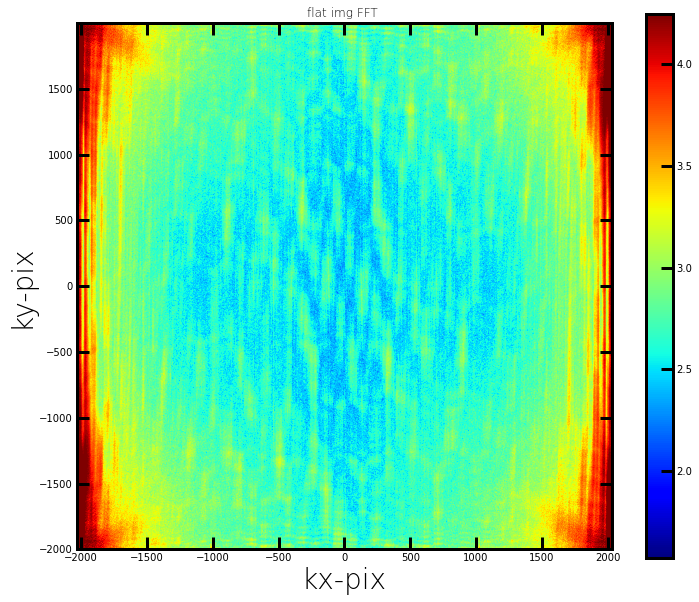

In [12]:
vmin=fourier_amplitudes_log.min()
vmax=fourier_amplitudes_log.max()
vmean=fourier_amplitudes_log.mean()
vmed=np.median(fourier_amplitudes_log)
vstd=np.std(fourier_amplitudes_log)
extent = KFREQX.min(),KFREQX.max(), KFREQY.min(),KFREQY.max()
print(f"vmin={vmin:.3f},vmax={vmax:.3f},vmean={vmean:.3f},vmed={vmed:.3f},vstd={vstd:.3f}")
nsig=2
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(12,10))
im=ax.imshow(fourier_amplitudes_log,origin="lower",vmin=vmed-nsig*vstd,vmax=vmed+nsig*vstd,extent=extent,cmap="jet")
ax.set_title("flat img FFT ")
ax.set_xlabel("kx-pix")
ax.set_ylabel("ky-pix")
fig.colorbar(im)

## FFT of all segments

vmin=0.114,vmax=1.438,vmean=1.001,vmed=1.000,vstd=0.017


/scratch/users/d/dagoret/ipykernel_2803/2212138990.py:52: RuntimeWarning: divide by zero encountered in true_divide
  IY,IX=np.where(np.logical_and(XX**2/a1**2+YY**2/b1**2>1, XX**2/a2**2+YY**2/b2**2<1))
/scratch/users/d/dagoret/ipykernel_2803/2212138990.py:52: RuntimeWarning: invalid value encountered in true_divide
  IY,IX=np.where(np.logical_and(XX**2/a1**2+YY**2/b1**2>1, XX**2/a2**2+YY**2/b2**2<1))


vmin=-4.621,vmax=12.016,vmean=1.408,vmed=1.462,vstd=0.640
vmin=0.330,vmax=1.108,vmean=1.001,vmed=0.999,vstd=0.015


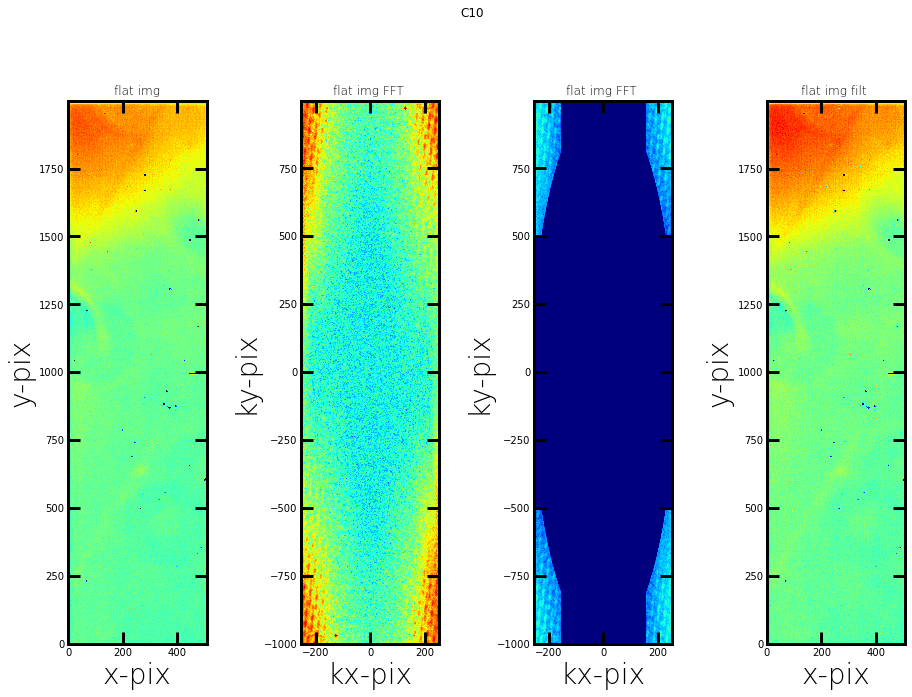

vmin=-1.290,vmax=9.528,vmean=1.003,vmed=1.003,vstd=0.039
vmin=-3.335,vmax=12.018,vmean=2.470,vmed=2.467,vstd=0.727
vmin=-0.845,vmax=3.986,vmean=1.003,vmed=1.003,vstd=0.031


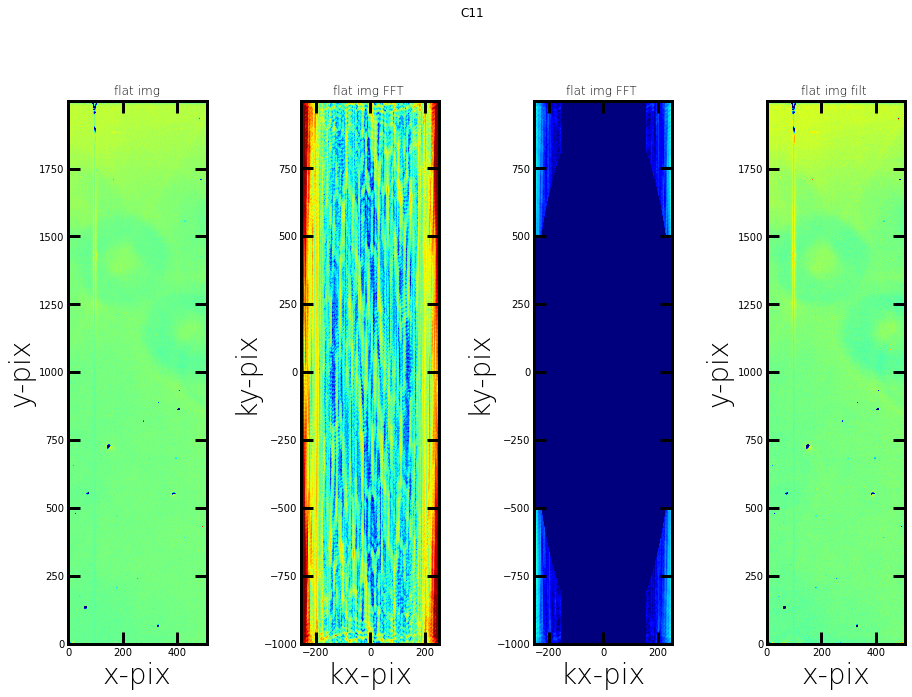

vmin=0.102,vmax=1.452,vmean=1.003,vmed=1.003,vstd=0.017
vmin=-4.044,vmax=12.018,vmean=1.446,vmed=1.483,vstd=0.673
vmin=0.075,vmax=1.217,vmean=1.003,vmed=1.003,vstd=0.015


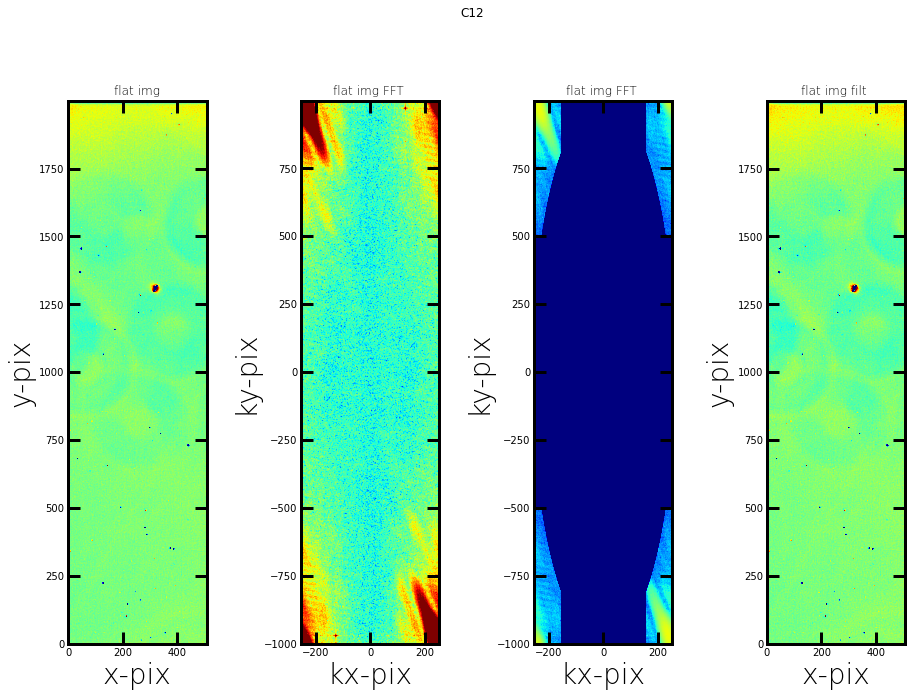

vmin=0.108,vmax=1.537,vmean=1.003,vmed=1.004,vstd=0.016
vmin=-5.342,vmax=12.018,vmean=1.409,vmed=1.474,vstd=0.620
vmin=0.471,vmax=1.153,vmean=1.003,vmed=1.004,vstd=0.014


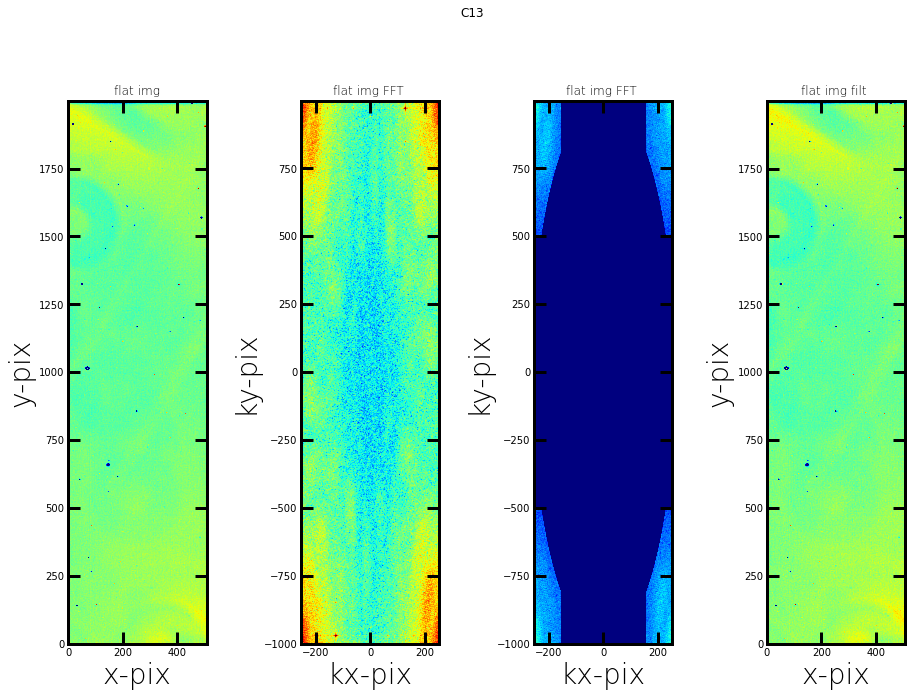

vmin=0.253,vmax=1.532,vmean=1.018,vmed=1.018,vstd=0.016
vmin=-3.786,vmax=12.031,vmean=1.314,vmed=1.386,vstd=0.608
vmin=0.574,vmax=1.231,vmean=1.018,vmed=1.018,vstd=0.014


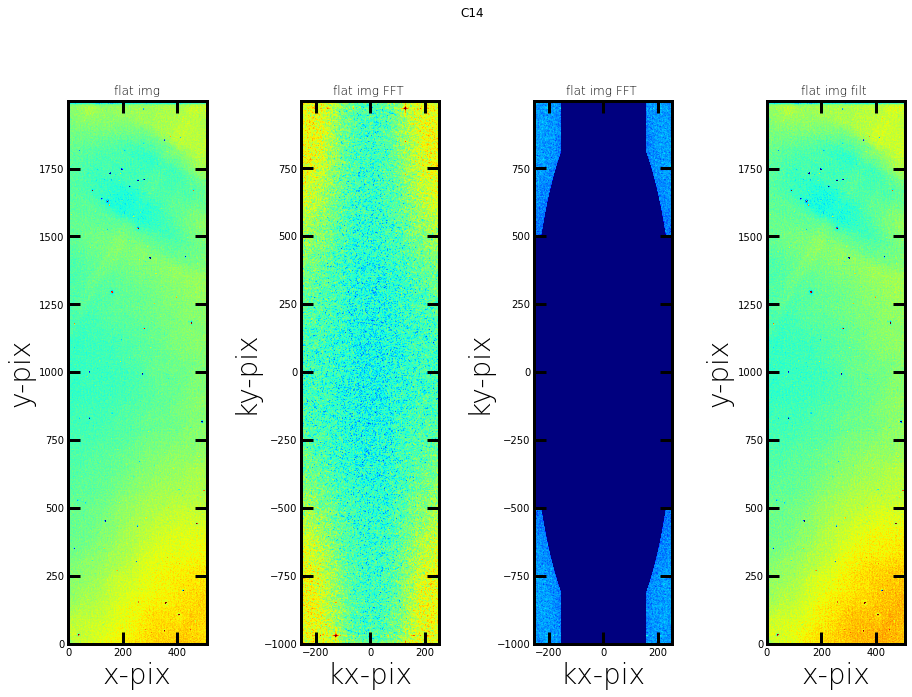

vmin=0.134,vmax=1.683,vmean=1.024,vmed=1.024,vstd=0.017
vmin=-4.707,vmax=12.036,vmean=1.418,vmed=1.488,vstd=0.608
vmin=0.565,vmax=1.324,vmean=1.024,vmed=1.024,vstd=0.014


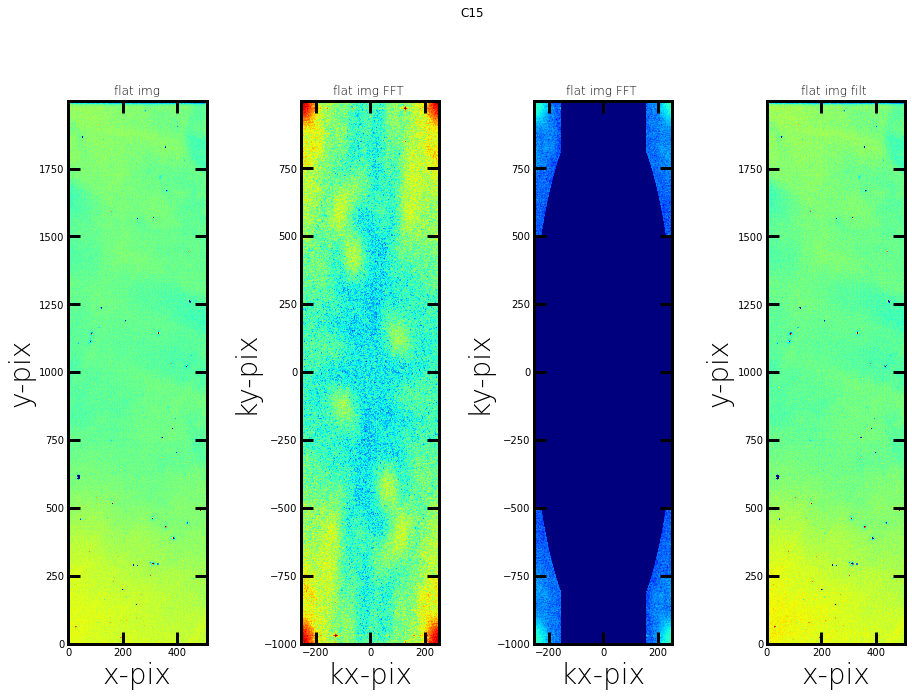

vmin=0.093,vmax=1.481,vmean=1.017,vmed=1.018,vstd=0.016
vmin=-3.664,vmax=12.031,vmean=1.342,vmed=1.411,vstd=0.611
vmin=0.402,vmax=1.284,vmean=1.017,vmed=1.018,vstd=0.014


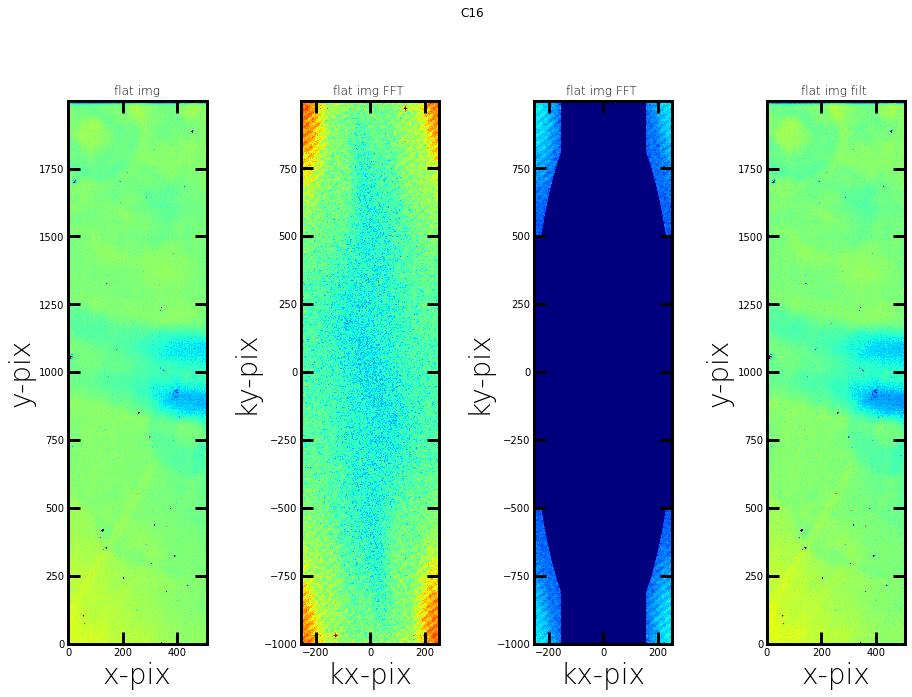

vmin=0.086,vmax=1.536,vmean=1.037,vmed=1.039,vstd=0.017
vmin=-5.793,vmax=12.047,vmean=1.424,vmed=1.490,vstd=0.621
vmin=0.459,vmax=1.203,vmean=1.037,vmed=1.039,vstd=0.015


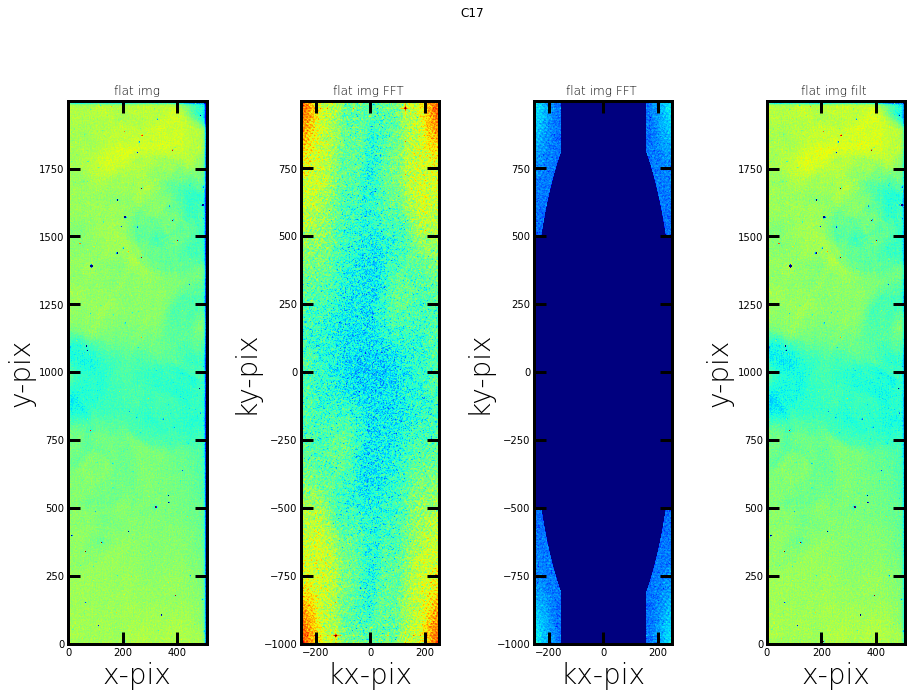

vmin=0.178,vmax=1.381,vmean=0.978,vmed=0.979,vstd=0.018
vmin=-3.993,vmax=11.996,vmean=1.450,vmed=1.496,vstd=0.655
vmin=0.202,vmax=1.180,vmean=0.978,vmed=0.979,vstd=0.016


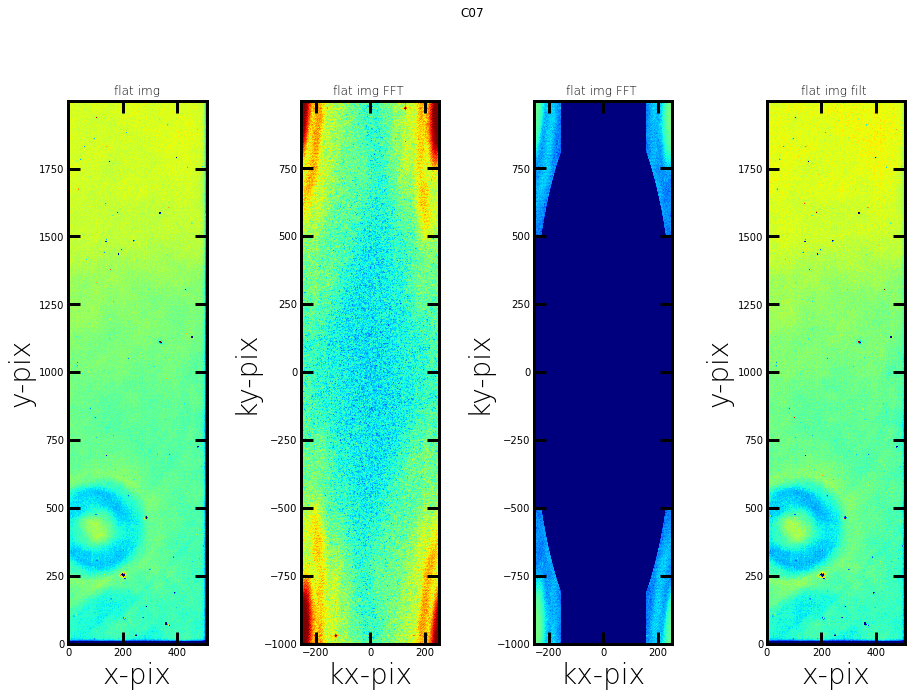

vmin=0.079,vmax=1.598,vmean=0.981,vmed=0.983,vstd=0.019
vmin=-4.071,vmax=11.999,vmean=1.523,vmed=1.570,vstd=0.653
vmin=0.251,vmax=1.256,vmean=0.981,vmed=0.983,vstd=0.018


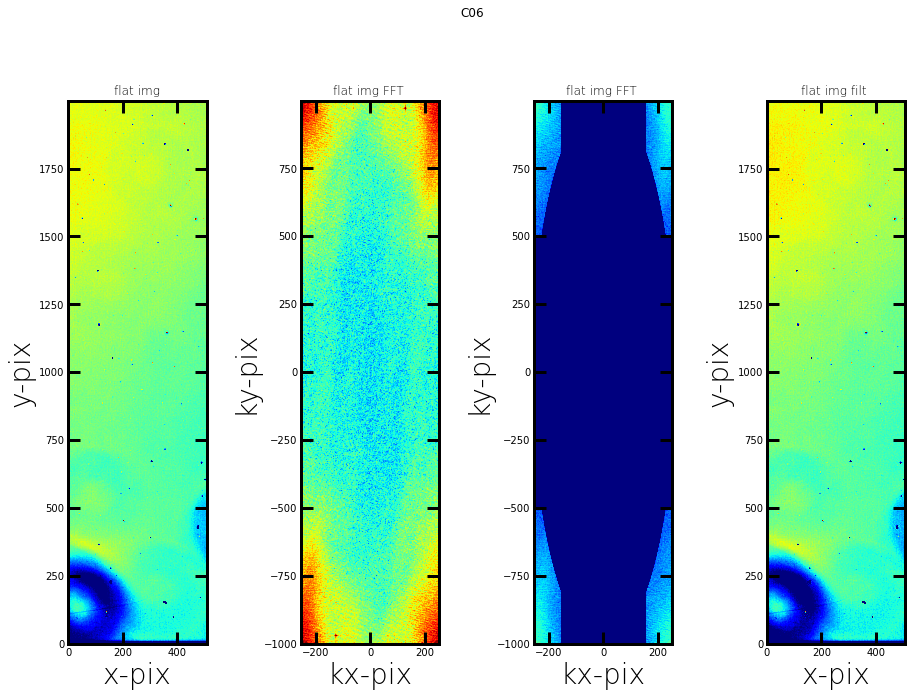

vmin=0.092,vmax=1.462,vmean=0.996,vmed=0.997,vstd=0.019
vmin=-4.609,vmax=12.012,vmean=1.401,vmed=1.448,vstd=0.654
vmin=0.207,vmax=1.138,vmean=0.996,vmed=0.996,vstd=0.017


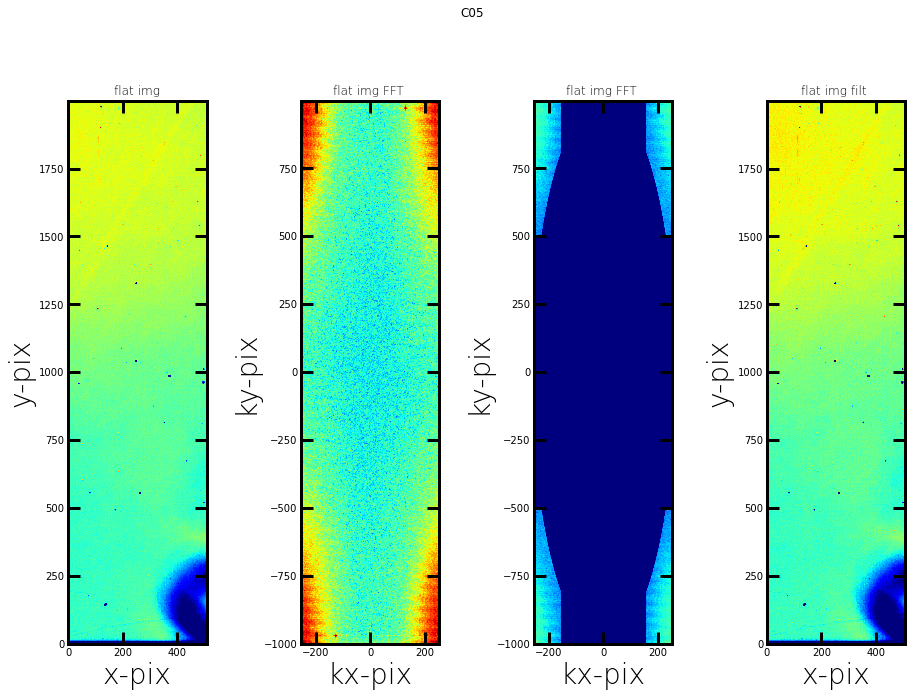

vmin=0.344,vmax=1.892,vmean=0.991,vmed=0.991,vstd=0.017
vmin=-4.237,vmax=12.007,vmean=1.264,vmed=1.340,vstd=0.601
vmin=0.619,vmax=1.244,vmean=0.991,vmed=0.990,vstd=0.015


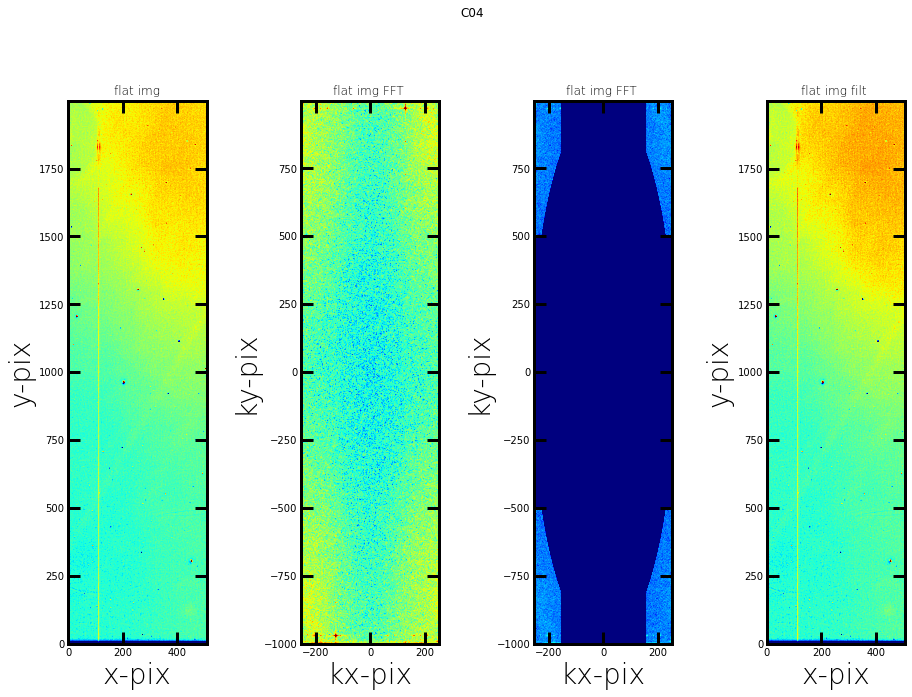

vmin=0.096,vmax=1.688,vmean=0.982,vmed=0.983,vstd=0.016
vmin=-4.418,vmax=12.000,vmean=1.389,vmed=1.456,vstd=0.613
vmin=0.485,vmax=1.300,vmean=0.982,vmed=0.983,vstd=0.014


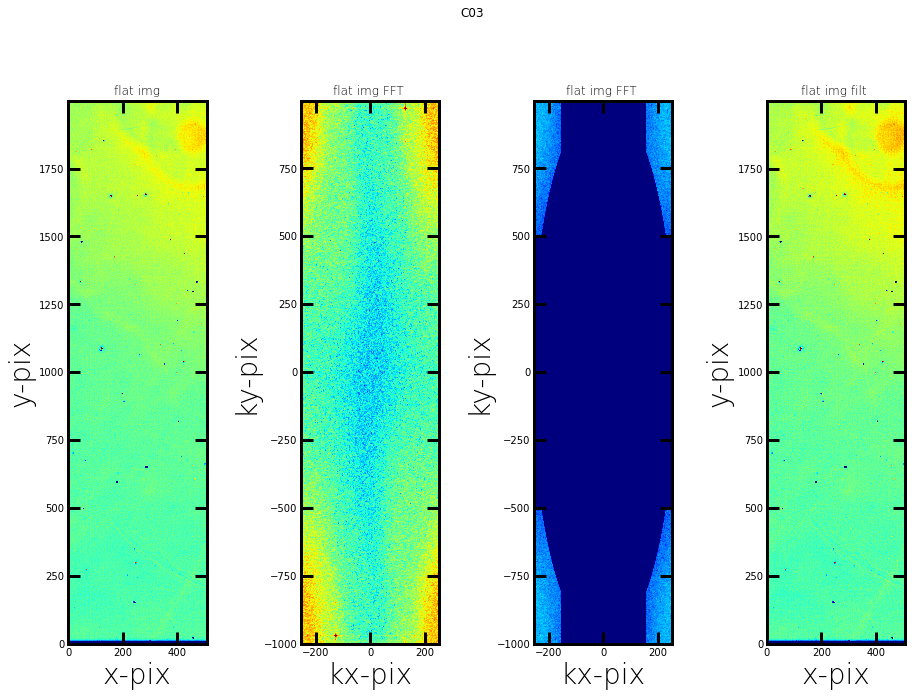

vmin=0.123,vmax=1.706,vmean=0.986,vmed=0.987,vstd=0.018
vmin=-4.725,vmax=12.004,vmean=1.613,vmed=1.658,vstd=0.657
vmin=0.221,vmax=1.273,vmean=0.986,vmed=0.987,vstd=0.016


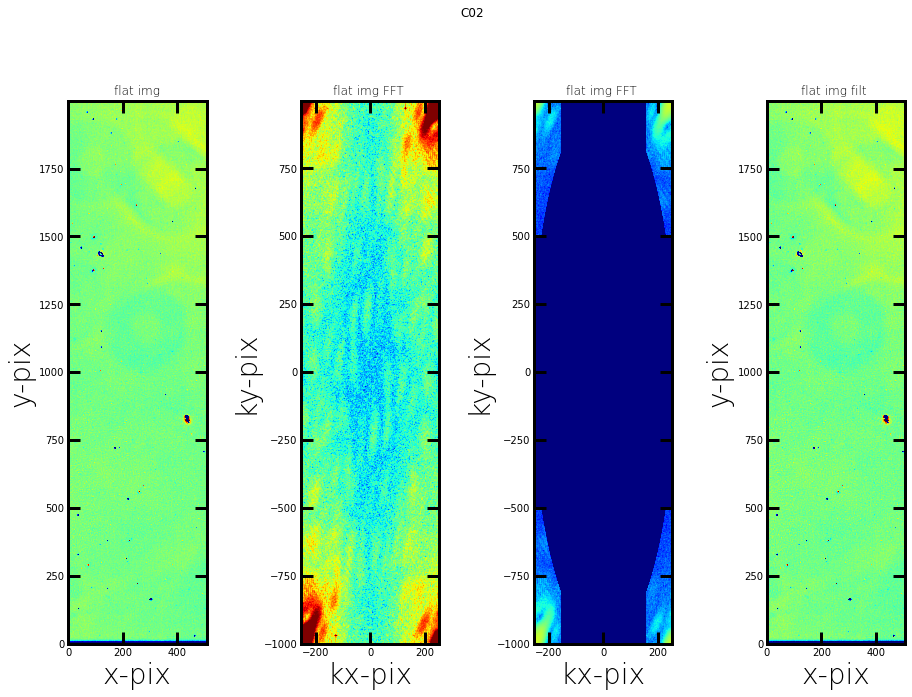

vmin=0.151,vmax=1.911,vmean=0.983,vmed=0.983,vstd=0.016
vmin=-4.253,vmax=12.000,vmean=1.472,vmed=1.529,vstd=0.636
vmin=0.204,vmax=1.236,vmean=0.983,vmed=0.984,vstd=0.014


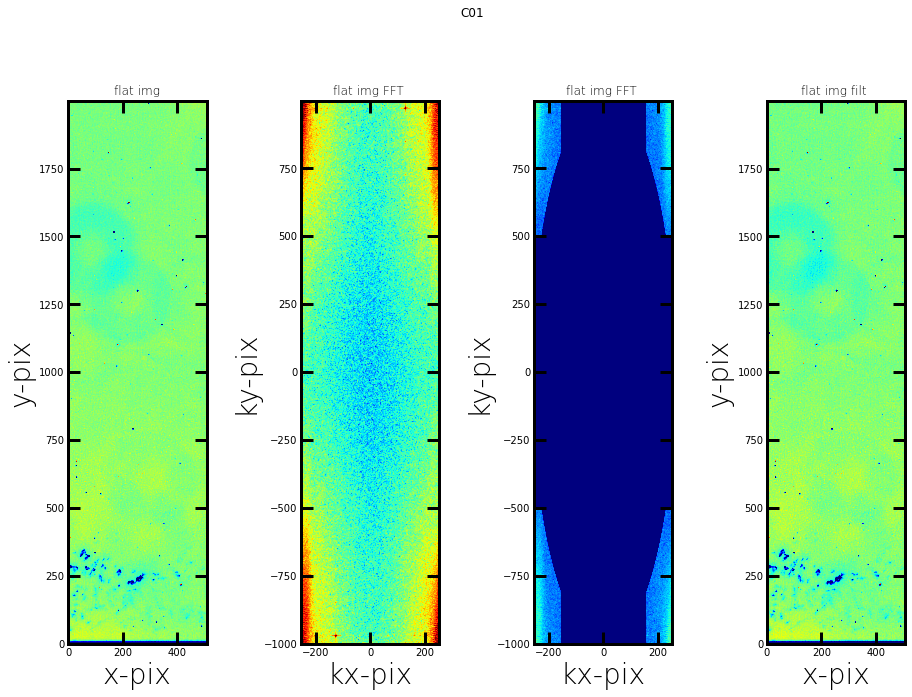

vmin=0.131,vmax=1.474,vmean=0.985,vmed=0.985,vstd=0.016
vmin=-4.762,vmax=12.002,vmean=1.504,vmed=1.568,vstd=0.624
vmin=0.455,vmax=1.225,vmean=0.985,vmed=0.986,vstd=0.014


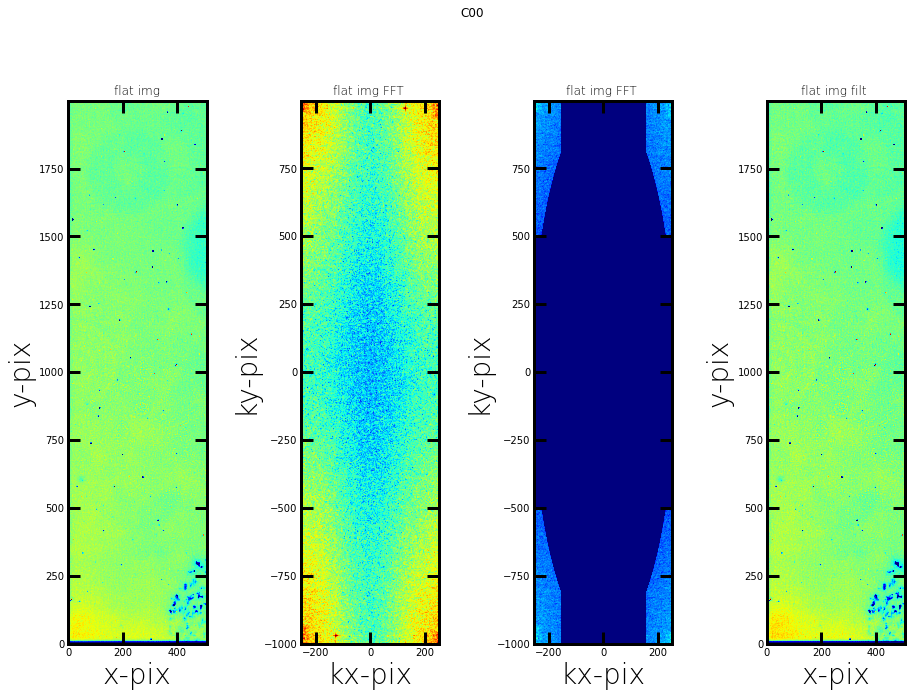

In [13]:
# Internal ellipse1
a1=0
b1=0
# External ellipse
a2=260
b2=1000




for ampIdx, amp in enumerate(calib.getDetector()):
    ampName = amp.getName()
    # This can work only on postISRCCD
    ampExp = calib.Factory(calib, amp.getBBox())
    
    fig, ax = plt.subplots(nrows=1, ncols=4,figsize=(16,10))
    vmin1= ampExp.image.array.min()
    vmax1= ampExp.image.array.max()
    vmean1= ampExp.image.array.mean()
    vmed1=np.median(ampExp.image.array)
    vstd1=np.std(ampExp.image.array)
    print(f"vmin={vmin1:.3f},vmax={vmax1:.3f},vmean={vmean1:.3f},vmed={vmed1:.3f},vstd={vstd1:.3f}")
    nsig1=2
    im=ax[0].imshow(ampExp.image.array,origin="lower",vmin=vmed1-nsig1*vstd1,vmax=vmed1+nsig1*vstd1,cmap="jet")
    ax[0].set_title("flat img")
    ax[0].set_xlabel("x-pix")
    ax[0].set_ylabel("y-pix")
    
    npixy,npixx=ampExp.image.array.shape
    
    
    kfreqx = np.fft.fftfreq(npixx) * npixx
    kfreqy = np.fft.fftfreq(npixy) * npixy
    kfreq2D = np.meshgrid(kfreqx, kfreqy)
    # k vector norm
    knrm = np.sqrt(kfreq2D[0]**2 + kfreq2D[1]**2)
    
    # Fourier transform
    fourier_image = np.fft.fftn(ampExp.image.array)
    fourier_amplitudes = np.abs(fourier_image)**2
    fourier_amplitudes_log = np.log10(fourier_amplitudes)
    
    
    # FFT to cut
    # (x-x0)^2/a^2 + (y-y0)^2/b^2 = 1
    #
    
    
    y0=npixy/2
    x0=npixx/2
    XX,YY=np.meshgrid(np.arange(npixx)-x0,np.arange(npixy)-y0)
    IY,IX=np.where(np.logical_and(XX**2/a1**2+YY**2/b1**2>1, XX**2/a2**2+YY**2/b2**2<1))

    
    fourier_image_erase=np.copy(fourier_image)
    eps=1e-10
    
    fourier_image_erase[IY,IX]=eps
    ipx=100
    ipy=500
    fourier_image_erase[ipy:npixy-ipy,:]=eps
    fourier_image_erase[:,ipx:npixx-ipx]=eps

    
    # do nothing
    #fourier_image_erase=np.copy(fourier_image)
    
    fourier_image_erase_log=np.log10(np.abs(fourier_image_erase))
    
    # Inverse Fourier transform
    image_filt=np.fft.ifftn(fourier_image_erase)
    image_filt=np.real(image_filt) 
    
    vmin2=fourier_amplitudes_log.min()
    vmax2=fourier_amplitudes_log.max()
    vmean2=fourier_amplitudes_log.mean()
    vmed2=np.median(fourier_amplitudes_log)
    vstd2=np.std(fourier_amplitudes_log)
    nsig2=2
    extent2 = kfreqx.min(),kfreqx.max(), kfreqy.min(),kfreqy.max()
    
    print(f"vmin={vmin2:.3f},vmax={vmax2:.3f},vmean={vmean2:.3f},vmed={vmed2:.3f},vstd={vstd2:.3f}")

    im=ax[1].imshow(fourier_amplitudes_log,origin="lower",vmin=vmed2-nsig2*vstd2,vmax=vmed2+nsig2*vstd2,extent=extent2,cmap="jet")
    ax[1].set_title("flat img FFT ")
    ax[1].set_xlabel("kx-pix")
    ax[1].set_ylabel("ky-pix")
    
    im=ax[2].imshow(fourier_image_erase_log,origin="lower",vmin=vmed2-nsig2*vstd2,vmax=vmed2+nsig2*vstd2,extent=extent2,cmap="jet")
    ax[2].set_title("flat img FFT ")
    ax[2].set_xlabel("kx-pix")
    ax[2].set_ylabel("ky-pix")
    
    
    vmin3= image_filt.min()
    vmax3= image_filt.max()
    vmean3= image_filt.mean()
    vmed3=np.median(image_filt)
    vstd3=np.std(image_filt)
    
    print(f"vmin={vmin3:.3f},vmax={vmax3:.3f},vmean={vmean3:.3f},vmed={vmed3:.3f},vstd={vstd3:.3f}")
    nsig3=2
    
    
    im=ax[3].imshow(image_filt,origin="lower",vmin=vmed3-nsig3*vstd3,vmax=vmed3+nsig3*vstd3,cmap="jet")
    ax[3].set_title("flat img filt ")
    ax[3].set_xlabel("x-pix")
    ax[3].set_ylabel("y-pix")
    
    
    plt.suptitle(ampName,y=1.01)
    plt.show()
    
    
    
    
    

# Power Spectrum
https://bertvandenbroucke.netlify.app/2019/05/24/computing-a-power-spectrum-in-python/

The kbin array will contain the start and end points of all bins; the corresponding k values are the midpoints of these bins:

In [14]:
KBINSX = np.arange(0.5, NPIXX//2+1, 1.)
KBINSY = np.arange(0.5, NPIXY//2+1, 1.)

In [15]:
KVALSX = 0.5 * (KBINSX[1:] + KBINSX[:-1])
KVALSY = 0.5 * (KBINSY[1:] + KBINSY[:-1])

In [16]:
flatArray = calib.getImage().getArray()

In [17]:
NY,NX=flatArray.shape 
DN=NX-NY

In [18]:
print(NX,NY,DN)

4072 4000 72


In [19]:
N1=DN//2
N2=DN-N1
NPIX=NX

In [20]:
A=np.ones((N1,NX))
B=np.ones((N2,NX))

In [21]:
flat_square = np.concatenate((A, flatArray,B), axis=0)

vmin=-1.290,vmax=9.528,vmean=0.999,vmed=0.998,vstd=0.025


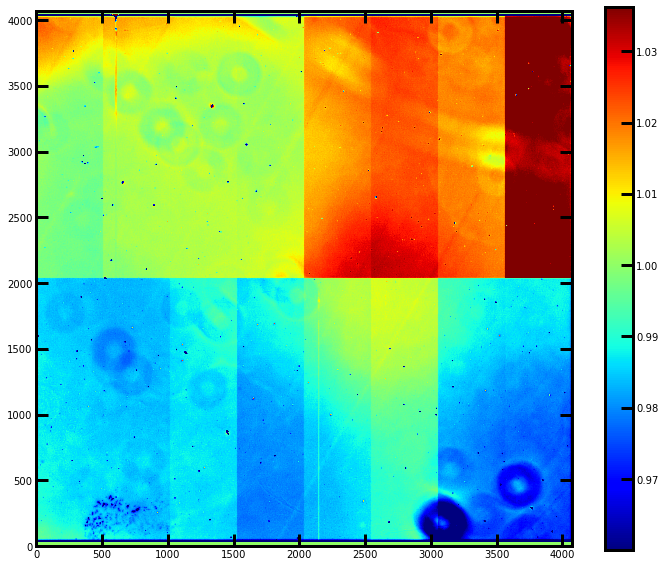

In [22]:
vmin=flat_square.min()
vmax=flat_square.max()
vmean=flat_square.mean()
vmed=np.median(flat_square)
vstd=np.std(flat_square)
print(f"vmin={vmin:.3f},vmax={vmax:.3f},vmean={vmean:.3f},vmed={vmed:.3f},vstd={vstd:.3f}")
nsig=1.5
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(12,10))
im=ax.imshow(flat_square,origin="lower",vmin=vmed-nsig*vstd,vmax=vmed+nsig*vstd,cmap="jet")
fig.colorbar(im)

In [30]:
fourier_image_square = np.fft.fftn(flat_square)
fourier_amplitudes_square = np.abs(fourier_image_square)**2
fourier_amplitudes_square_log = np.log10(fourier_amplitudes_square)

In [31]:
# pixel frequency
KFREQX = np.fft.fftfreq(NPIX) * NPIX
KFREQY = np.fft.fftfreq(NPIX) * NPIX
KFREQ2D = np.meshgrid(KFREQX, KFREQY)
# k vector norm
KNRM = np.sqrt(KFREQ2D[0]**2 + KFREQ2D[1]**2)

vmin=-4.340,vmax=14.439,vmean=2.875,vmed=2.909,vstd=0.669


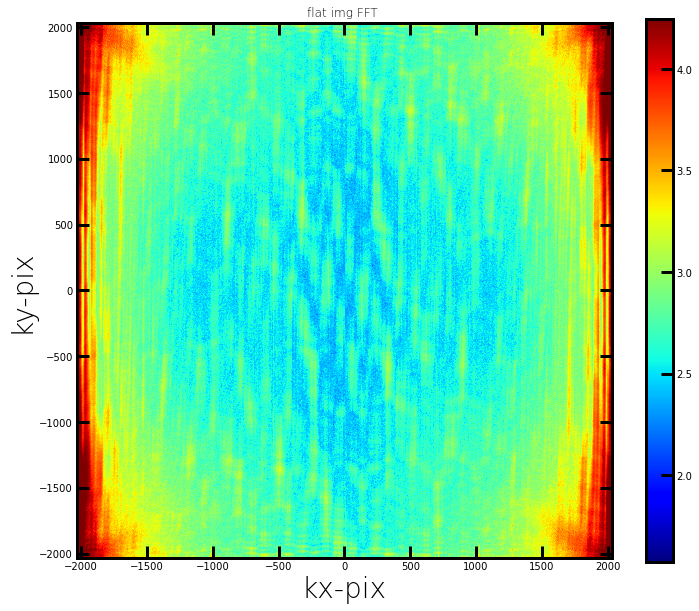

In [32]:
vmin=fourier_amplitudes_square_log.min()
vmax=fourier_amplitudes_square_log.max()
vmean=fourier_amplitudes_square_log.mean()
vmed=np.median(fourier_amplitudes_square_log)
vstd=np.std(fourier_amplitudes_square_log)
extent = KFREQX.min(),KFREQX.max(), KFREQY.min(),KFREQY.max()
print(f"vmin={vmin:.3f},vmax={vmax:.3f},vmean={vmean:.3f},vmed={vmed:.3f},vstd={vstd:.3f}")
nsig=2
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(12,10))
im=ax.imshow(fourier_amplitudes_square_log,origin="lower",vmin=vmed-nsig*vstd,vmax=vmed+nsig*vstd,extent=extent,cmap="jet")
ax.set_title("flat img FFT ")
ax.set_xlabel("kx-pix")
ax.set_ylabel("ky-pix")
fig.colorbar(im)

In [62]:
KBINS = np.arange(0.5, NPIX//2+1, 1.)
KVALS = 0.5 * (KBINS[1:] + KBINS[:-1])

In [65]:
KNRM.shape

(4072, 4072)

Remember that we want the total variance within each bin. Right now, we only have the average power. To get the total power, we need to multiply with the volume in each bin (in 2D, this volume is actually a surface area):

In [66]:
import scipy.stats as stats

KNRM_flat = KNRM.flatten()
fourier_amplitudes_square_flat = fourier_amplitudes_square.flatten()

Abins, _, _ = stats.binned_statistic(KNRM_flat , fourier_amplitudes_square_flat ,
                                     statistic = "mean",
                                     bins = KBINS)

We compute the surface area as the difference between the surface area of two discs with respective radii ku and kl, which are the k values at the lower and the upper edge of the bin. This is a more accurate version of the commonly used surface element 2πkdk, since this latter formula is technically only valid for infinitesimally small dk.

In [67]:
Abins *= np.pi * (KBINS[1:]**2 - KBINS[:-1]**2)

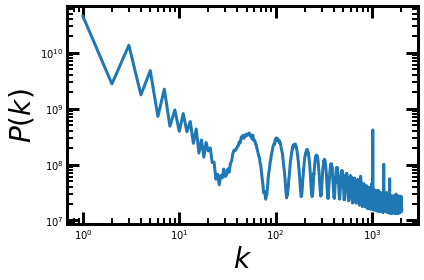

In [70]:
plt.loglog(KVALS, Abins)
plt.xlabel("$k$")
plt.ylabel("$P(k)$")
plt.tight_layout()

# Filtering

In [57]:
x0=NPIX/2
y0=x0
R1=1900
R2=2000
XX,YY=np.meshgrid(np.arange(NPIX)-x0,np.arange(NPIX)-y0)
IY,IX=np.where(np.logical_and(XX**2+YY**2>R1**2,XX**2+YY**2<R2**2))
fourier_image_square_erase=np.copy(fourier_amplitudes_square)
eps=1e-10
fourier_image_square_erase[IY,IX]=eps
fourier_image_square_erase_log=np.log10(np.abs(fourier_image_square_erase))

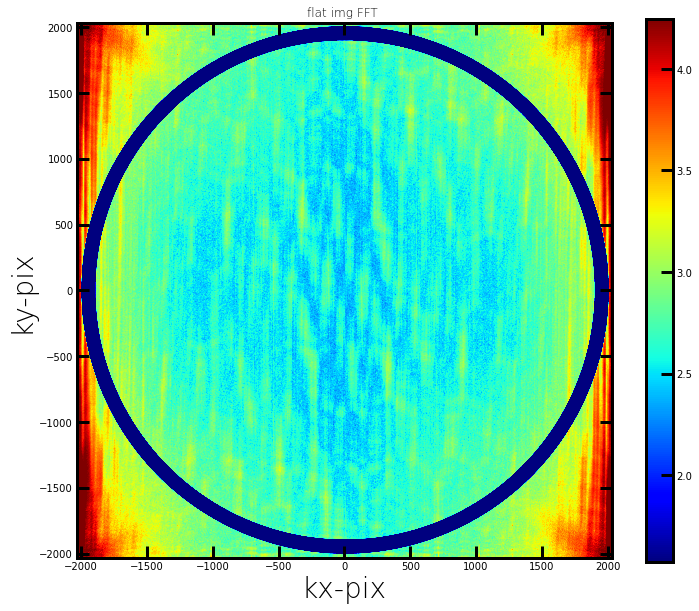

In [58]:
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(12,10))
im=ax.imshow(fourier_image_square_erase_log,origin="lower",vmin=vmed-nsig*vstd,vmax=vmed+nsig*vstd,extent=extent,cmap="jet")
ax.set_title("flat img FFT ")
ax.set_xlabel("kx-pix")
ax.set_ylabel("ky-pix")
fig.colorbar(im)

In [59]:
# Inverse Fourier transform
image_square_filt=np.fft.ifftn(fourier_image_square_erase)
#image_square_filt=np.fft.ifftn(fourier_image_square) 
image_square_filt=np.real(image_square_filt) 
    
vmin2=image_square_filt.min()
vmax2=image_square_filt.max()
vmean2=image_square_filt.mean()
vmed2=np.median(image_square_filt)
vstd2=np.std(image_square_filt)
nsig2=2

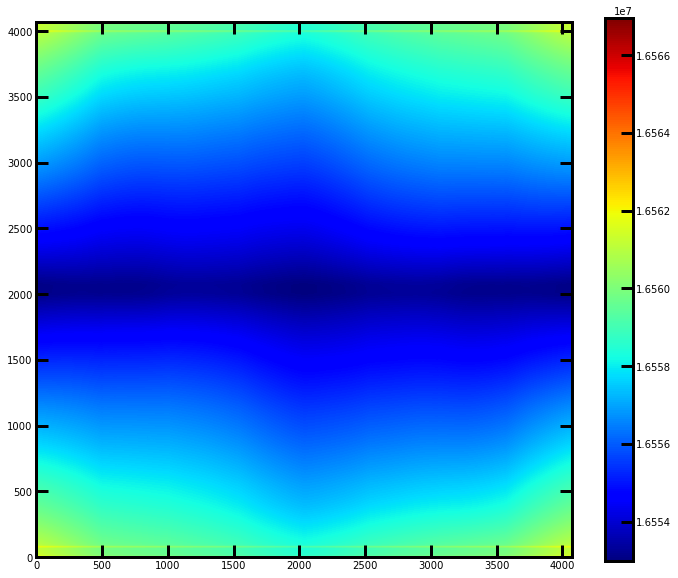

In [60]:
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(12,10))
im=ax.imshow(image_square_filt,origin="lower",cmap="jet")
fig.colorbar(im)